1. Заливаем видео на Roboflow, делаем кадрирование -> скачиваем все кадры как датасет (см скрин ниже, скачиваем в формате YOLOv8 в разделе txt)
2. скачивается архив, нужно его разархивировать и закинуть разархивированную папку на гугл диск
3. КОПИРУЕМ К СЕБЕ НА ГУГЛ ДИСК ЭТОТ БЛОКНОТ
4. далее выполняем всё по ячейкам, в каждой ячейке расписана цель ее запуска

Формат  - YOLOv8 в блоке 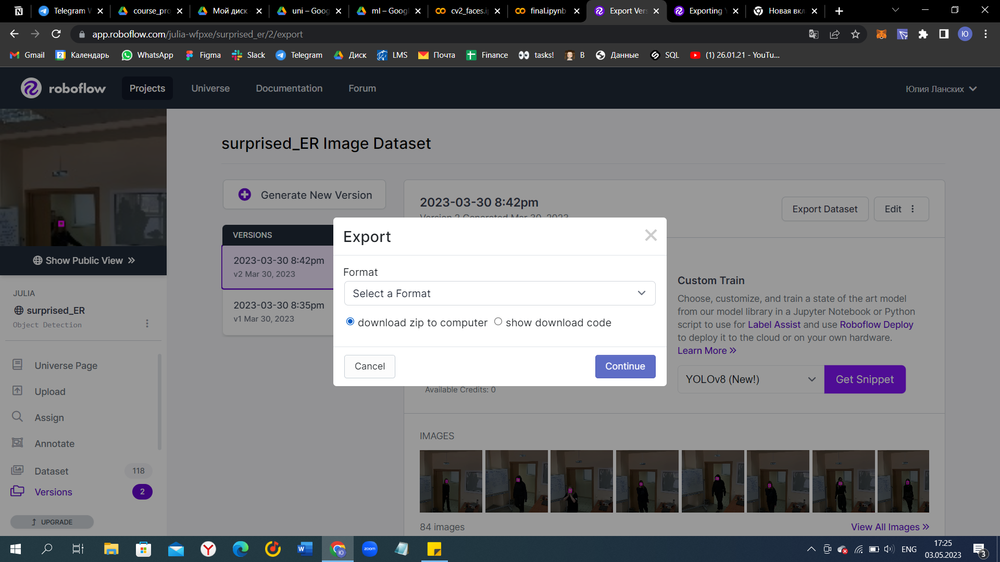

In [ ]:
# подключаем гугл диск
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
# импортируем нужные библиотеки
try:
  # Colab only
  %tensorflow_version 2.x
except Exception:
    pass
import tensorflow as tf
print(tf.__version__)

import tensorflow.keras as keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Reshape,AveragePooling2D, SeparableConv2D,Conv2D, MaxPooling2D
from tensorflow.keras import backend as K

import matplotlib.pyplot as plt
import numpy as np
import os
!pip install mtcnn

from mtcnn.mtcnn import MTCNN
from mtcnn import MTCNN
import cv2
from google.colab.patches import cv2_imshow

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
2.12.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 60.5 MB/s eta 0:00:00


In [ ]:
# в эту переменную добавляем путь к папке, в которой содержатся все фотографии, из которых нужно вырезать квадрат лица
train_dir='/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images'
test_dir='/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/test/images'
valid_dir='/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images'

## **TRAIN set**

In [ ]:
# объединяем все пути к фотографиям из вышеуказанной папки, записываем эти пути в один список - fnames_valid
train_dir=os.path.join(train_dir)
fnames_valid = [os.path.join(train_dir, fname) for fname in os.listdir(train_dir)]

In [ ]:
# проверяем себя, чтобы в строчках действительно содержатся пути к фотографиям (см в конце каждого строчного элемента формат .jpg)
print(fnames_valid)

from PIL import Image

['/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379_happily_surprised_mp4-57_jpg.rf.c8d741eb5d99efc66a90e7b504ca39c9.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379_happily_surprised_mp4-63_jpg.rf.a03365ca5ec3c21502185d027aaaa492.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379_happily_surprised_mp4-58_jpg.rf.b8f795f5d5c7d45060b8ff3657447159.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379_happily_surprised_mp4-65_jpg.rf.38c772821f1d3519f994d423d146d3fe.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379_happily_surprised_mp4-54_jpg.rf.04c32edbcd41dde8715a446f8f5072dc.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379_happily_surprised_mp4-56_jpg.rf.530dad2b2785b5f7221c58dab5173adb.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/train/images/IMG_0379

1/1 [==============================] - 0s 139ms/step


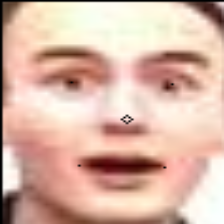

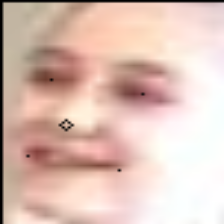

1/1 [==============================] - 0s 41ms/step


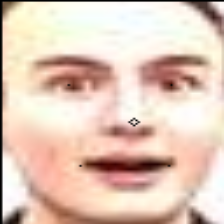

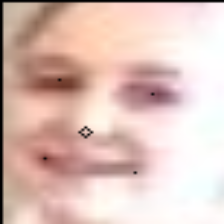

2/2 [==============================] - 0s 15ms/step


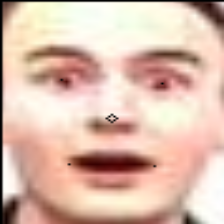

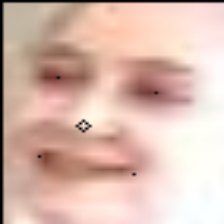

1/1 [==============================] - 0s 66ms/step


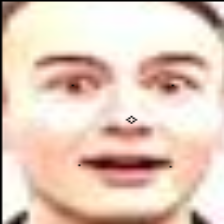

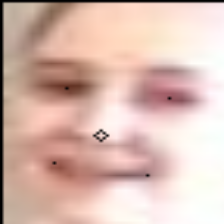

1/1 [==============================] - 0s 34ms/step


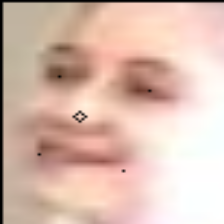

1/1 [==============================] - 0s 45ms/step


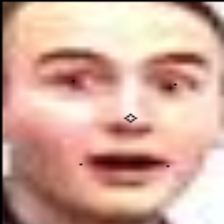

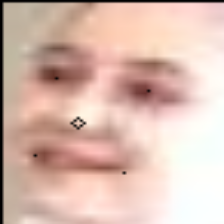

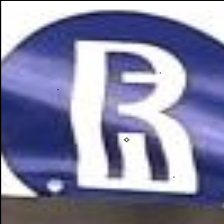

1/1 [==============================] - 0s 47ms/step


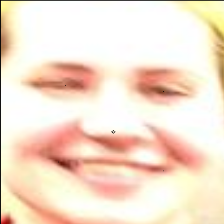

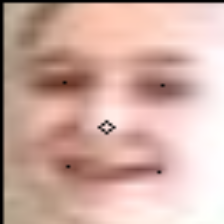

1/1 [==============================] - 0s 56ms/step


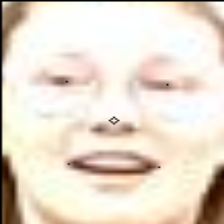

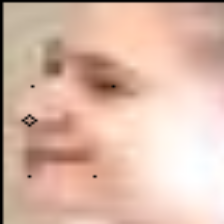

1/1 [==============================] - 0s 31ms/step


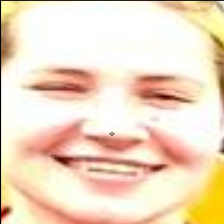

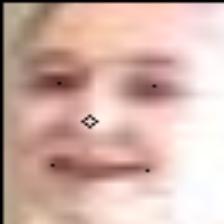

1/1 [==============================] - 0s 32ms/step


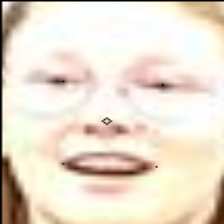

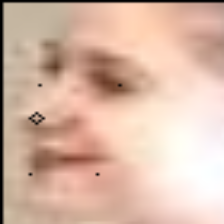

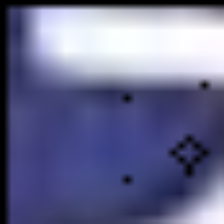

1/1 [==============================] - 0s 42ms/step


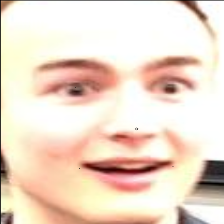

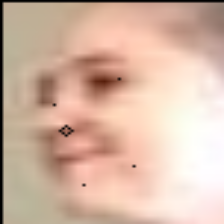

1/1 [==============================] - 0s 49ms/step


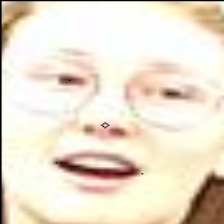

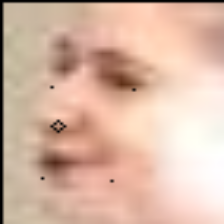

1/1 [==============================] - 0s 50ms/step


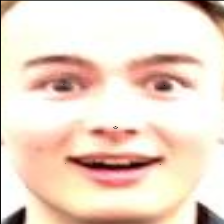

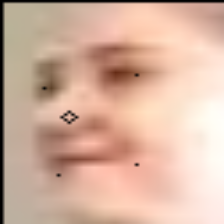

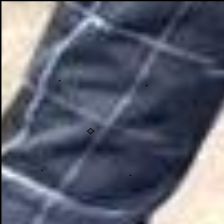

1/1 [==============================] - 0s 38ms/step


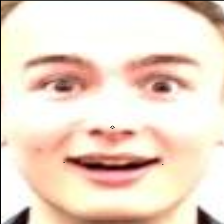

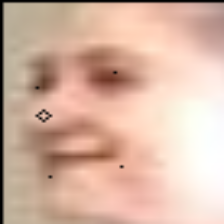

1/1 [==============================] - 0s 37ms/step


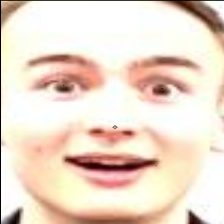

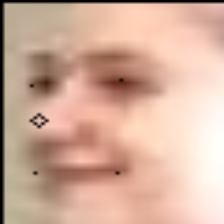

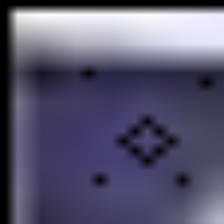

1/1 [==============================] - 0s 42ms/step


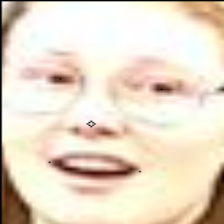

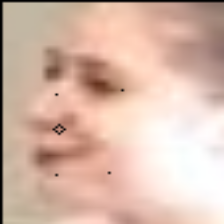

1/1 [==============================] - 0s 43ms/step


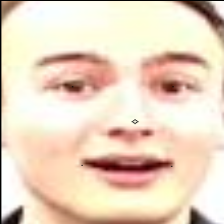

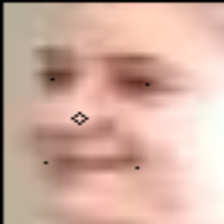

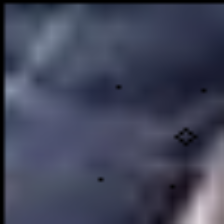

1/1 [==============================] - 0s 45ms/step


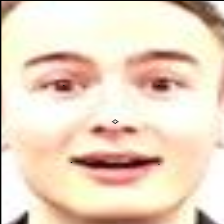

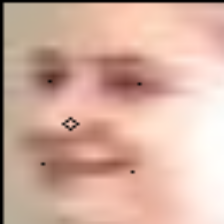

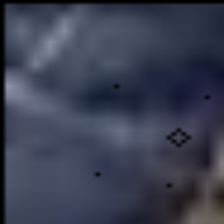

1/1 [==============================] - 0s 36ms/step


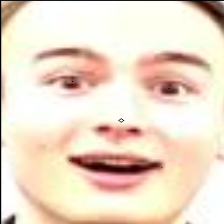

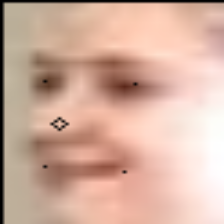

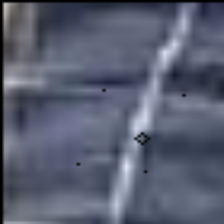

1/1 [==============================] - 0s 44ms/step


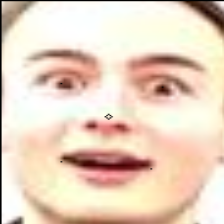

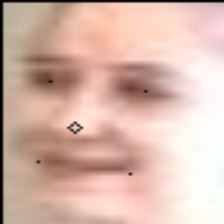

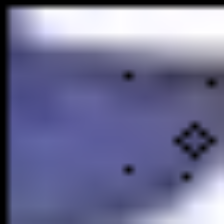

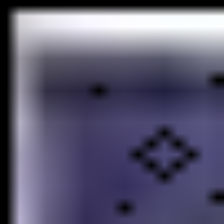

2/2 [==============================] - 0s 6ms/step


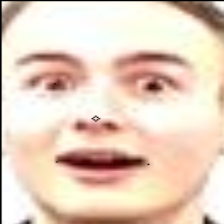

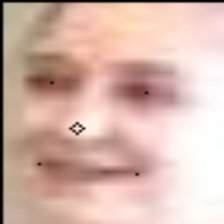

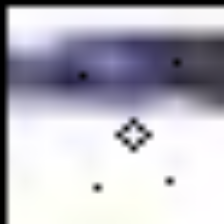

1/1 [==============================] - 0s 47ms/step


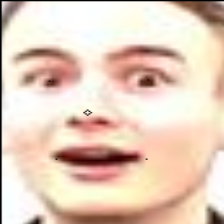

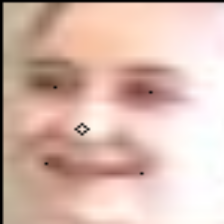

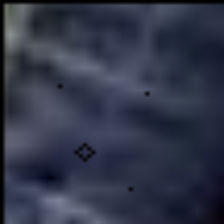

1/1 [==============================] - 0s 43ms/step


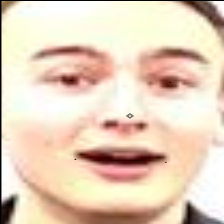

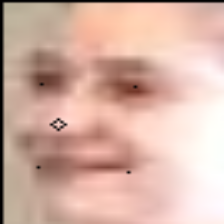

1/1 [==============================] - 0s 100ms/step


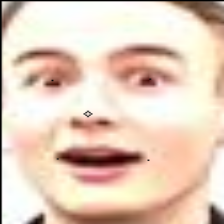

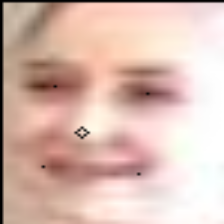

1/1 [==============================] - 0s 43ms/step


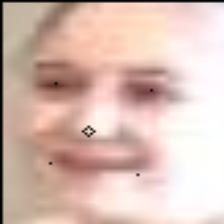

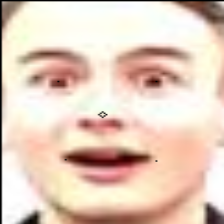

1/1 [==============================] - 0s 37ms/step


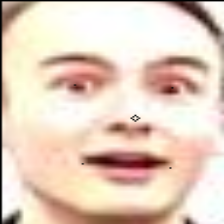

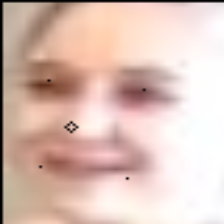

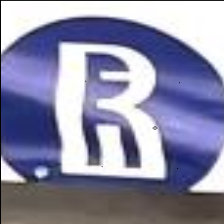

1/1 [==============================] - 0s 70ms/step


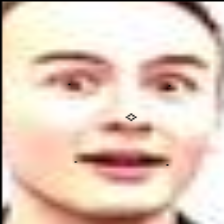

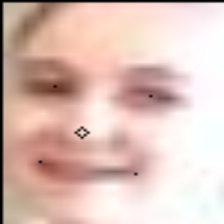

1/1 [==============================] - 0s 46ms/step


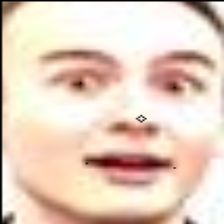

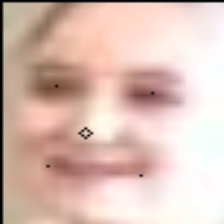

1/1 [==============================] - 0s 50ms/step


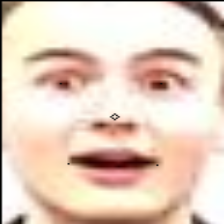

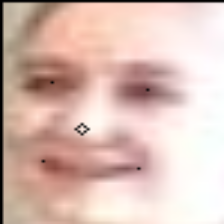

1/1 [==============================] - 0s 44ms/step


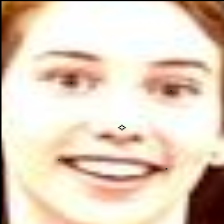

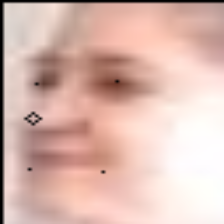

1/1 [==============================] - 0s 64ms/step


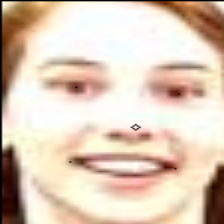

1/1 [==============================] - 0s 43ms/step


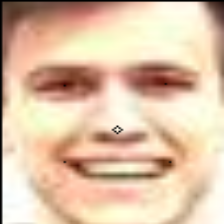

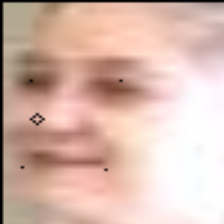

1/1 [==============================] - 0s 99ms/step


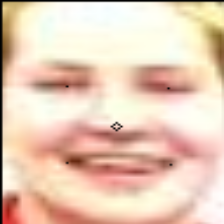

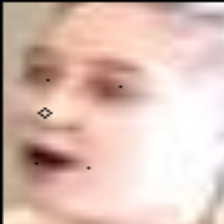

1/1 [==============================] - 0s 35ms/step


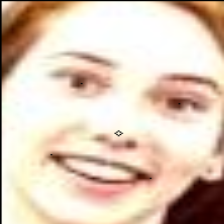

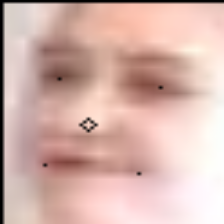

1/1 [==============================] - 0s 62ms/step


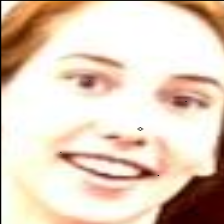

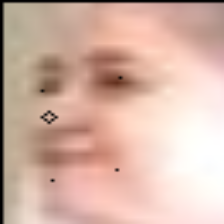

1/1 [==============================] - 0s 39ms/step


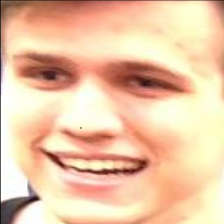

1/1 [==============================] - 0s 48ms/step


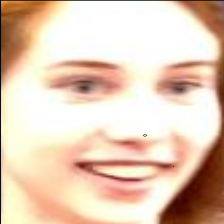

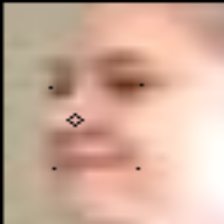

1/1 [==============================] - 0s 44ms/step


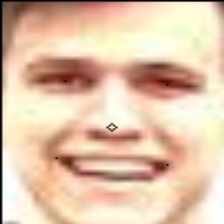

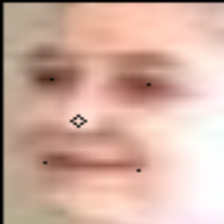

1/1 [==============================] - 0s 30ms/step


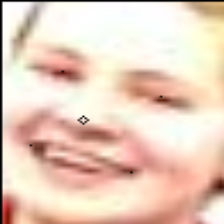

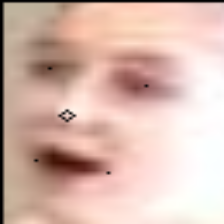

1/1 [==============================] - 0s 41ms/step


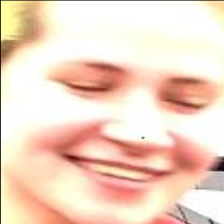

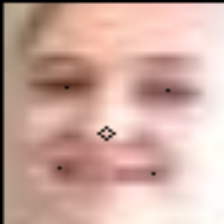

1/1 [==============================] - 0s 54ms/step


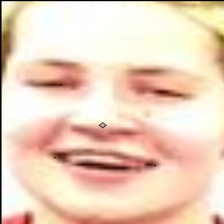

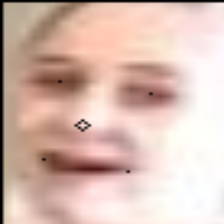

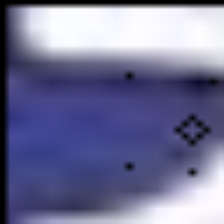

1/1 [==============================] - 0s 38ms/step


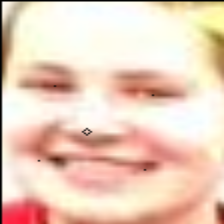

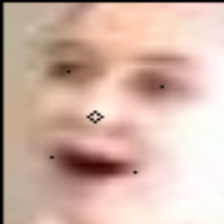

1/1 [==============================] - 0s 59ms/step


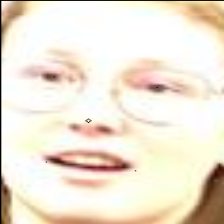

1/1 [==============================] - 0s 45ms/step


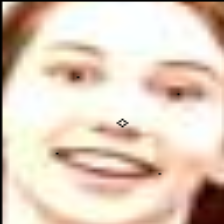

1/1 [==============================] - 0s 42ms/step


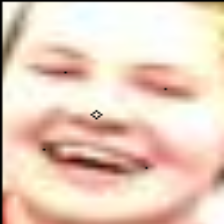

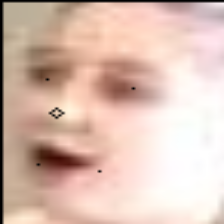

1/1 [==============================] - 0s 58ms/step


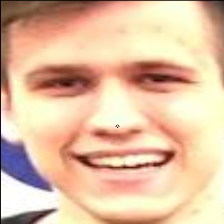

1/1 [==============================] - 0s 35ms/step


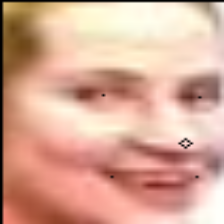

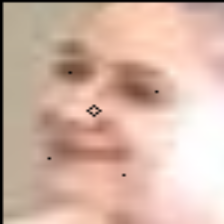

1/1 [==============================] - 0s 45ms/step


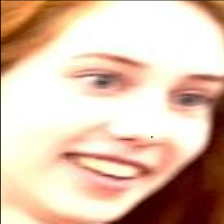

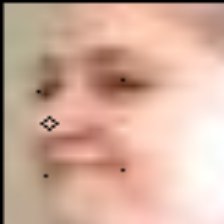

1/1 [==============================] - 0s 52ms/step


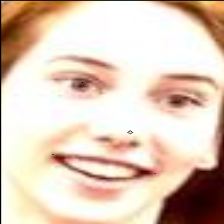

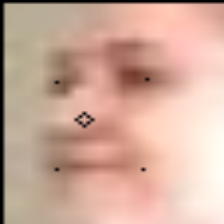

1/1 [==============================] - 0s 47ms/step


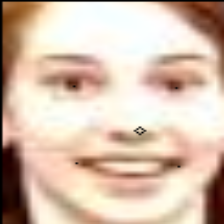

1/1 [==============================] - 0s 49ms/step


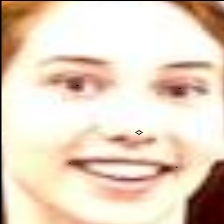

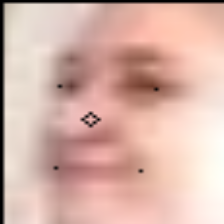

1/1 [==============================] - 0s 44ms/step


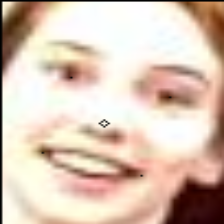

1/1 [==============================] - 0s 48ms/step


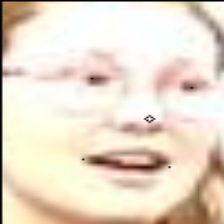

1/1 [==============================] - 0s 37ms/step


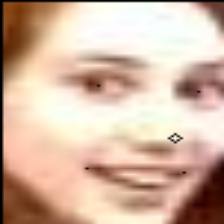

1/1 [==============================] - 0s 53ms/step


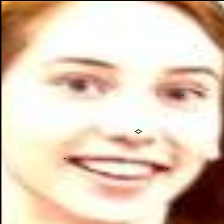

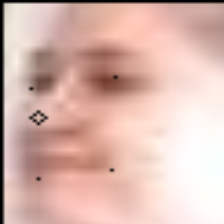

1/1 [==============================] - 0s 41ms/step


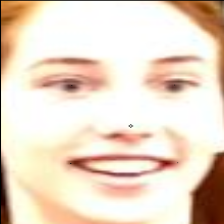

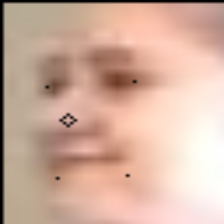

1/1 [==============================] - 0s 43ms/step


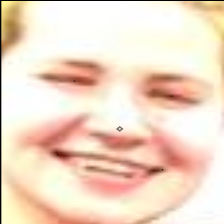

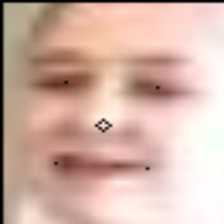

1/1 [==============================] - 0s 45ms/step


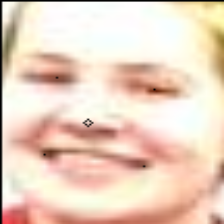

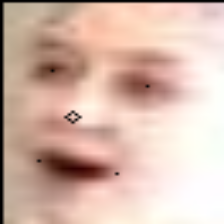

1/1 [==============================] - 0s 84ms/step


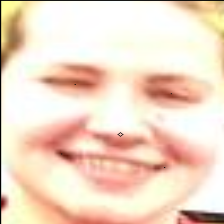

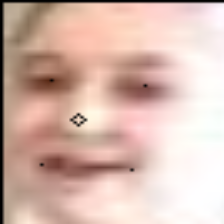

1/1 [==============================] - 0s 39ms/step


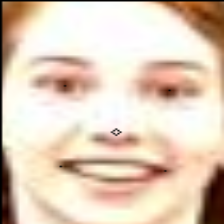

1/1 [==============================] - 0s 35ms/step


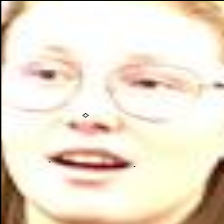

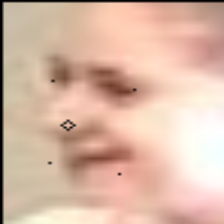

1/1 [==============================] - 0s 56ms/step


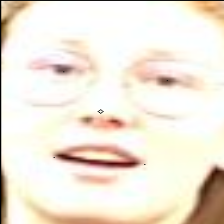

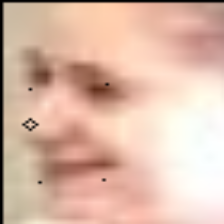

1/1 [==============================] - 0s 75ms/step


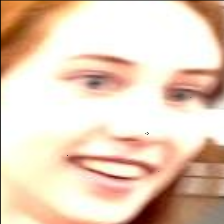

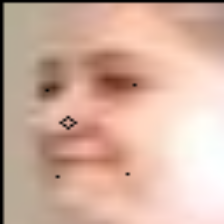

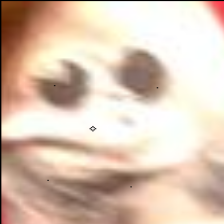

1/1 [==============================] - 0s 42ms/step


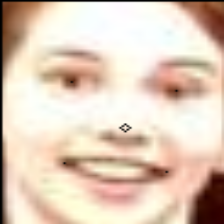

1/1 [==============================] - 0s 48ms/step


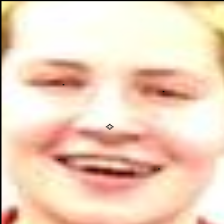

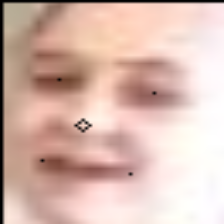

1/1 [==============================] - 0s 44ms/step


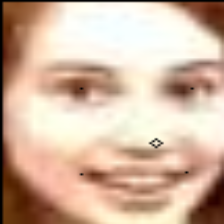

1/1 [==============================] - 0s 41ms/step


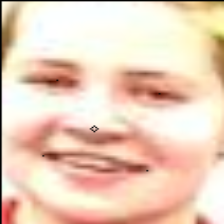

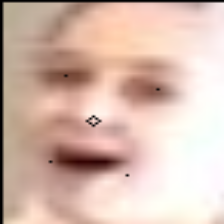

1/1 [==============================] - 0s 45ms/step


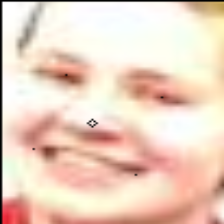

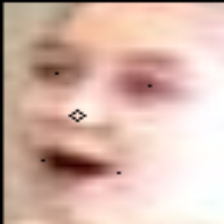

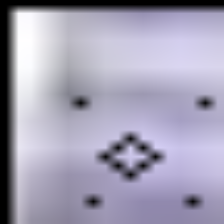

1/1 [==============================] - 0s 36ms/step


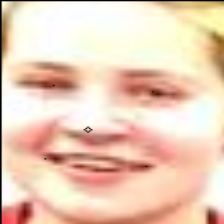

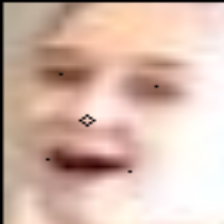

1/1 [==============================] - 0s 39ms/step


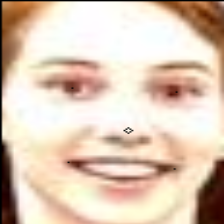

In [ ]:
# просто запускаем и ждем!

from mtcnn.mtcnn import MTCNN
from mtcnn import MTCNN
import cv2
from google.colab.patches import cv2_imshow
detector = MTCNN()

k = 0
f = 0
for img_path in fnames_valid:
  img_r = cv2.imread(img_path)
  img = cv2.resize(img_r, None, fx=3, fy=3, interpolation=cv2.INTER_LINEAR)
  # img = img_rr[200:1000, 100:1700]
  # cv2_imshow(img)
  output = detector.detect_faces(img)
  # print(output)                                                                 #[{},{}...{}]
  for i in output:
    x,y,width,height = i['box']
    left_eyeX,left_eyeY = i['keypoints']['left_eye']
    right_eyeX,right_eyeY = i['keypoints']['right_eye']
    noseX,noseY = i['keypoints']['nose']
    mouth_leftX,mouth_leftY = i['keypoints']['mouth_left']
    mouth_rightX,mouth_rightY = i['keypoints']['mouth_right']

    cv2.circle(img,center=(left_eyeX,left_eyeY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(right_eyeX,right_eyeY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(noseX,noseY),color=(0,0,0),thickness=0,radius=2)
    cv2.circle(img,center=(mouth_leftX,mouth_leftY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(mouth_rightX,mouth_rightY),color=(0,0,0),thickness=0,radius=0)
    cv2.rectangle(img,pt1=(x,y),pt2=(x+width,y+height),color=(0,0,0),thickness=0)

    if len(output) == 0:
      img1 = img
    else:
      img1 = img[y:y+height, x:x+width]


    size = (224, 224)
    output_img = cv2.resize(img1, size)
    cv2_imshow(output_img)
    cv2.imwrite(img_path, output_img)

    cv2.waitKey(0)

# img = cv2.imread('image.jpg')
# resized_img = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
# cv2.imshow('Resized image', resized_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-129_jpg.rf.b395c361be5a89feffea0fc5996c83dd.jpg


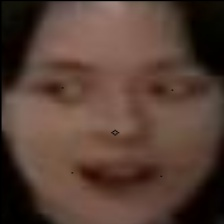

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-113_jpg.rf.55c940082092cc1fbad6ce0061b7f779.jpg


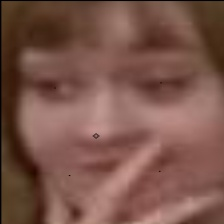

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-108_jpg.rf.21e6ba1940919e626af87cb5df59cacd.jpg


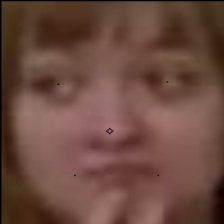

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-106_jpg.rf.084f2e0774c4061e44b8c586030f3a1d.jpg


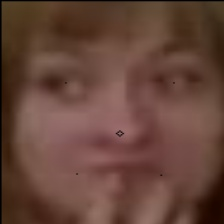

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-105_jpg.rf.31c054bbe9320aaf303b55f73248d1e5.jpg


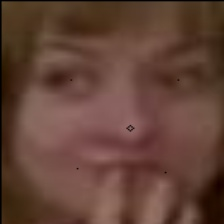

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8347_surprised_fhd-1-_mp4-4_jpg.rf.b74d3b43c7f9d9d9ec652d8dd9c16aa1.jpg


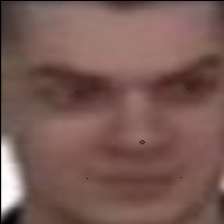

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-69_jpg.rf.0c1306cd3cc946bed863ee7f8325382b.jpg


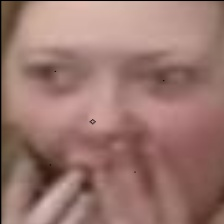

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-68_jpg.rf.f345db56a8997eac718205e7db8d6281.jpg


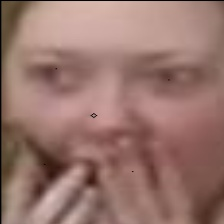

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-67_jpg.rf.f3f8c5813547fc3c09e577e3a0bfcb01.jpg


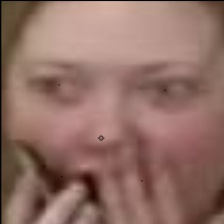

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8347_surprised_fhd-1-_mp4-2_jpg.rf.f81588d5e1d733eae1051944b4faf211.jpg


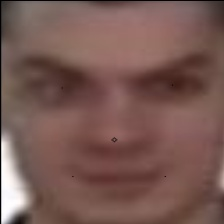

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-70_jpg.rf.2caabfa2bda3da8db7969e0fafb8085a.jpg


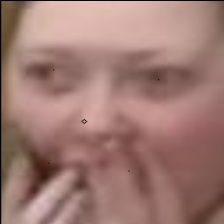

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-66_jpg.rf.66725d9f38f9c8325ab16709cfe948d8.jpg


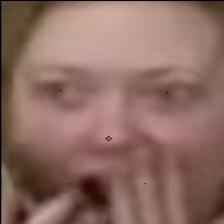

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-48_jpg.rf.6db0e503a0df8278a522421864d7158a.jpg


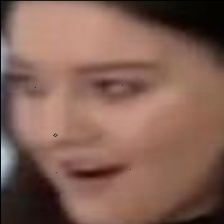

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-43_jpg.rf.b31561aef40f428111dae0c362cec995.jpg


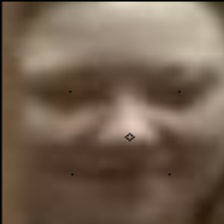

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-42_jpg.rf.d6aa004d2344a76554f5fe503869062e.jpg


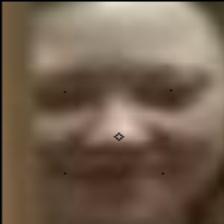

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-41_jpg.rf.debddce7cdc990ee9c380ef2d5fce67a.jpg


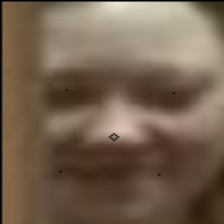

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-39_jpg.rf.36cb47a3e93a006edad6d078121dc7ac.jpg


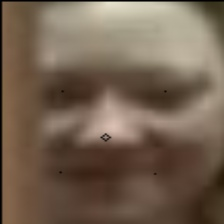

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-37_jpg.rf.9bbd966f622bcbd21b3ca00dad93b81d.jpg


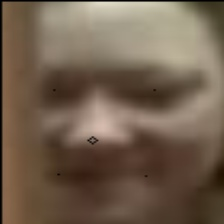

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-36_jpg.rf.6df614040e03fbe8e8a49ecf56306607.jpg


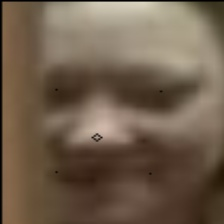

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-47_jpg.rf.11cf9942a3818a6545d355f055ef5443.jpg


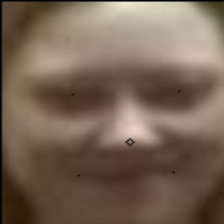

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-40_jpg.rf.37833e4433a8ea94a52babc5124df58f.jpg


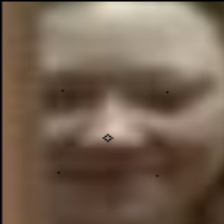

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-34_jpg.rf.56d247e5332eb66399156b56d34e457e.jpg


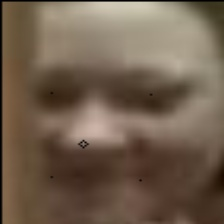

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-31_jpg.rf.ffaabb8d26e16287317d983cc1cea372.jpg


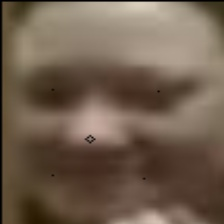

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-30_jpg.rf.419030847bc8a797a1fa6468a907192b.jpg


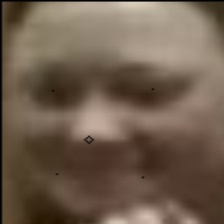

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-174_jpg.rf.f323097fedbc9c40946eb1851fdd7c03.jpg


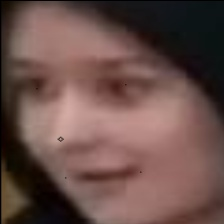

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-29_jpg.rf.5df6bc6800e653eed7688dff7f0e2a92.jpg


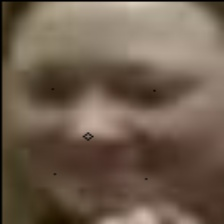

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-32_jpg.rf.c4974f99c78e99a5e82d6f10e6182a49.jpg


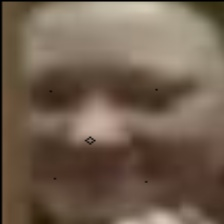

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-172_jpg.rf.9c6d4b7b23a56b14686a9e8725d29a4b.jpg


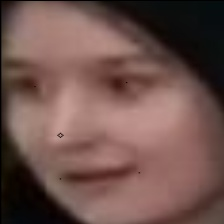

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-170_jpg.rf.49da507ed9bf400135d92e7dde3f9af8.jpg


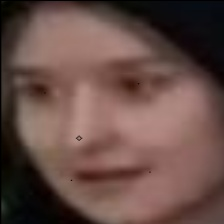

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-171_jpg.rf.b9758cf2b5efc9ac7be6e224b04a9888.jpg


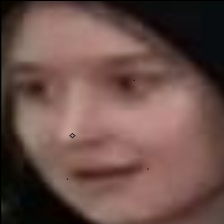

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-167_jpg.rf.c1eade9433e85e41ed3f567df9238806.jpg


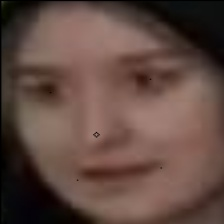

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-173_jpg.rf.00eaad7c5cafad18cb05806ca2a4d4e1.jpg


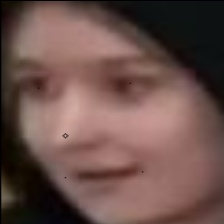

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-168_jpg.rf.794f6db315912db6a0b1ebb7ef492a9a.jpg


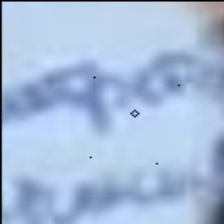

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-164_jpg.rf.26672e03e0935abef97ceaeebc9bc4d5.jpg


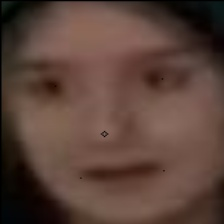

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-162_jpg.rf.0b686593ead9b0e2bacb99347b0a3bdd.jpg


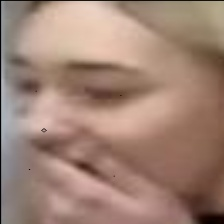

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-163_jpg.rf.8b3fdf91b2e701af0744920a11f37cf9.jpg


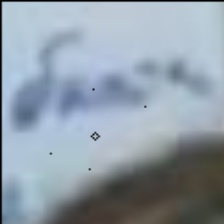

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-161_jpg.rf.63dd9eb02636cba4a13dcfa0a18a4f88.jpg


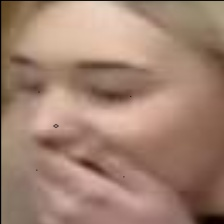

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-156_jpg.rf.33a60a962f44338995ef36cf8185cbaa.jpg


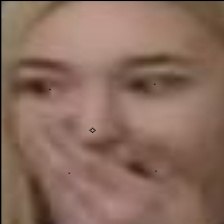

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-153_jpg.rf.3ba2f95fd9cc1952a04865e2a1944474.jpg


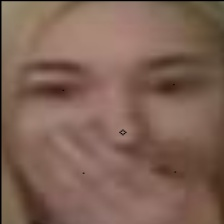

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-155_jpg.rf.568a65626408768674910c4202ed5741.jpg


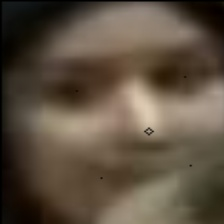

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-158_jpg.rf.f73f9b201f83b77df4fbbcd5ff0497e2.jpg


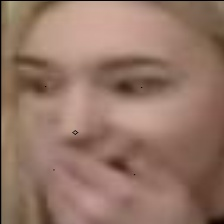

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-159_jpg.rf.ab57ee0a3a0aaf258ec3f3441f831979.jpg


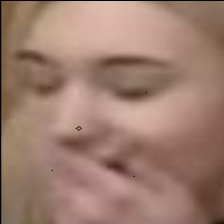

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-157_jpg.rf.2c9c0e50f7f6e65a7f5ac6aa436cb0e4.jpg


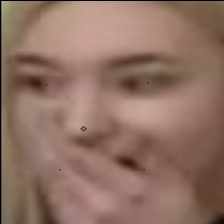

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-154_jpg.rf.2ffb8fbb8ac2cc694966c49809cff402.jpg


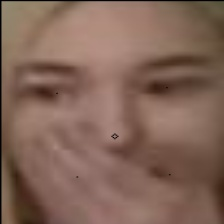

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-149_jpg.rf.7c36f63fcbc840113e623c307581a668.jpg


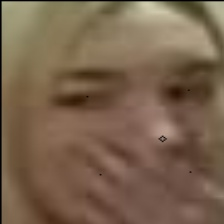

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-139_jpg.rf.10e6724b13b77e0c483868339a824a20.jpg


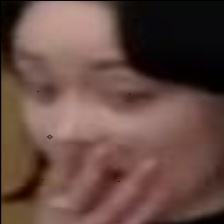

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-137_jpg.rf.88a221da6dc5349da8149648bf13da49.jpg


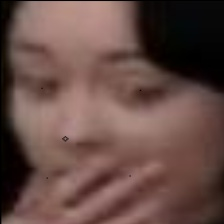

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-151_jpg.rf.6fb8beb990bfe9b5faaa891264f5b8db.jpg


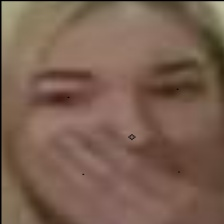

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-134_jpg.rf.e3dfbf572a92036eed7a9903c87e810a.jpg


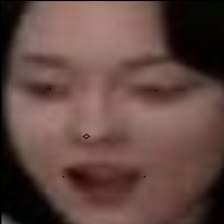

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-133_jpg.rf.f990ea061b2c0eab505ed8b79ac58399.jpg


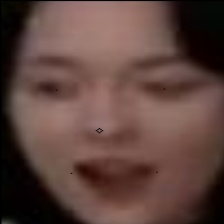

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-128_jpg.rf.eaad170ea0f05d72e555087a1c8f2a10.jpg


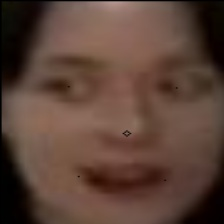

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-150_jpg.rf.8b987104910a6c23d3eca440d3f72ec2.jpg


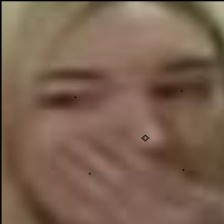

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-136_jpg.rf.4c478f14f9a5b400191817082c31529c.jpg


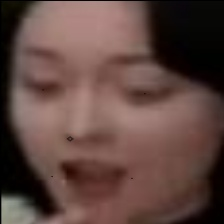

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-114_jpg.rf.18221c2cbc76aae9dac67836e689a40b.jpg


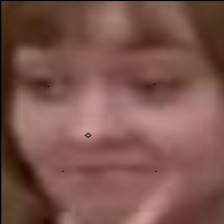

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-112_jpg.rf.59ef15dbe71011cebf7c012d9e907c2f.jpg


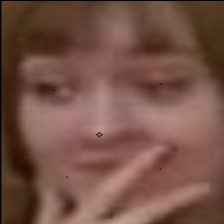

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-111_jpg.rf.d89be71f0fc27fc773cfe956d4598173.jpg


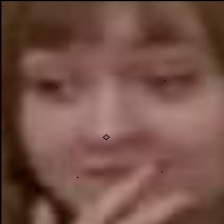

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-110_jpg.rf.a500bee32955f030ff593d2f9b5e0c4e.jpg


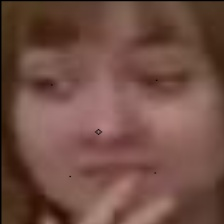

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8347_surprised_fhd-1-_mp4-0_jpg.rf.18c04dbb9424a1ec9709a56114566172.jpg


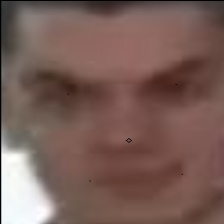

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-71_jpg.rf.c4ea1f666e63b27fbd0ef62a593585ed.jpg


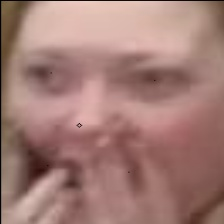

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/train/images/IMG_8336_surprised_fhd_mp4-72_jpg.rf.1659450f05bf4f63424f359bafca82ec.jpg


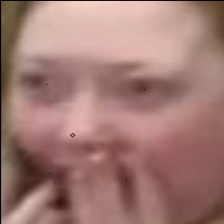

In [ ]:
# проверяем, что все фотографии обновились, и сохранились обрезанные квадраты лица
for img_path in fnames_valid:
  img_r = cv2.imread(img_path)
  print(img_path)
  cv2_imshow(img_r)


## **VALID set**

In [ ]:
# объединяем все пути к фотографиям из вышеуказанной папки, записываем эти пути в один список - fnames_valid
valid_dir=os.path.join(valid_dir)
fnames_valid = [os.path.join(valid_dir, fname) for fname in os.listdir(valid_dir)]

In [ ]:
# проверяем себя, чтобы в строчках действительно содержатся пути к фотографиям (см в конце каждого строчного элемента формат .jpg)
print(fnames_valid)



['/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_0379_happily_surprised_mp4-241_jpg.rf.8936658a395835f53125b65a9d965e46.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_0379_happily_surprised_mp4-194_jpg.rf.a1bedd47763ec749e9e2ade1cd24fead.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_0379_happily_surprised_mp4-195_jpg.rf.5f169a9317a916811ee6af701ed91aab.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_0379_happily_surprised_mp4-156_jpg.rf.56a4cc72bbe8d79e4bed30e75344135e.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_0379_happily_surprised_mp4-86_jpg.rf.143c46cf8a701228d7943aadc27f151a.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_0379_happily_surprised_mp4-82_jpg.rf.308c4ae90c77f22e6b1d847cc4da1ebb.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER_new.v2i.yolov8/valid/images/IMG_

1/1 [==============================] - 0s 134ms/step


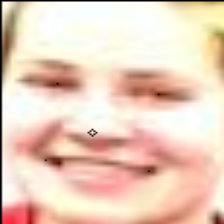

1/1 [==============================] - 0s 46ms/step


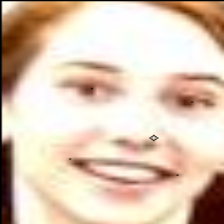

1/1 [==============================] - 0s 34ms/step


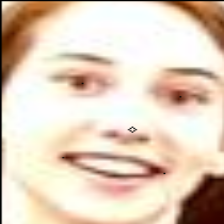

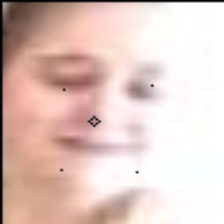

1/1 [==============================] - 0s 44ms/step


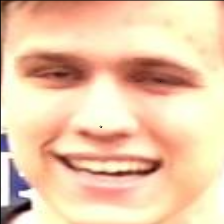

1/1 [==============================] - 0s 45ms/step


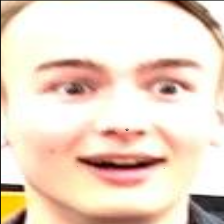

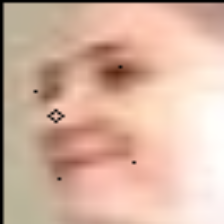

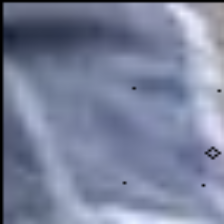

1/1 [==============================] - 0s 66ms/step


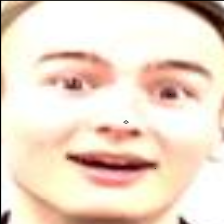

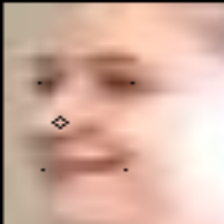

1/1 [==============================] - 0s 39ms/step


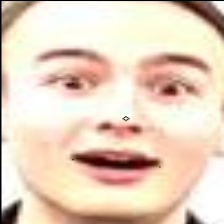

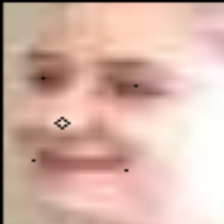

1/1 [==============================] - 0s 55ms/step


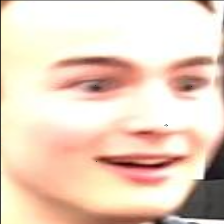

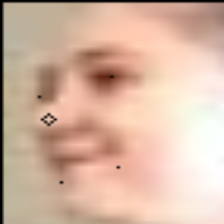

1/1 [==============================] - 0s 44ms/step


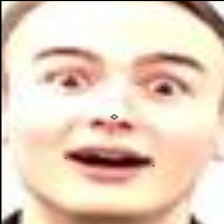

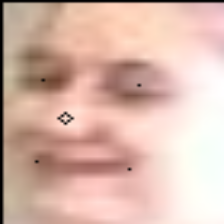

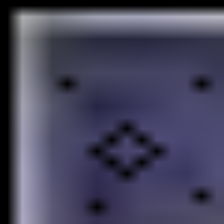

1/1 [==============================] - 0s 40ms/step


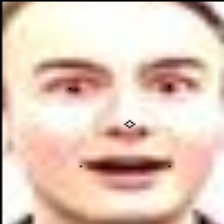

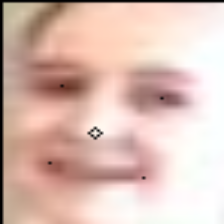

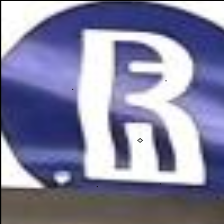

1/1 [==============================] - 0s 50ms/step


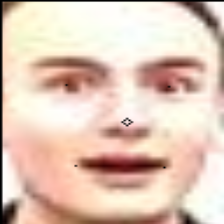

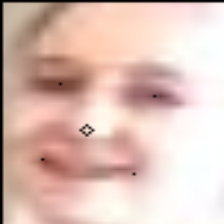

1/1 [==============================] - 0s 42ms/step


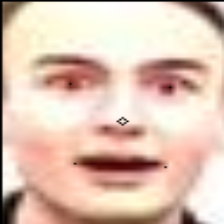

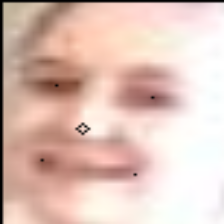

1/1 [==============================] - 0s 52ms/step


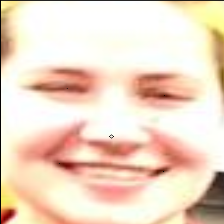

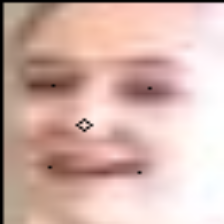

1/1 [==============================] - 0s 34ms/step


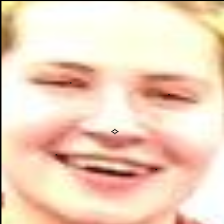

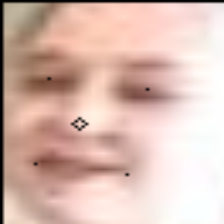

1/1 [==============================] - 0s 40ms/step


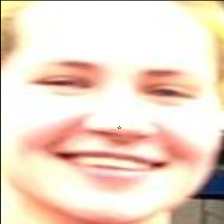

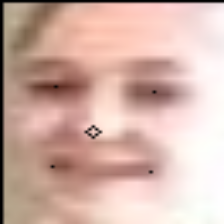

1/1 [==============================] - 0s 39ms/step


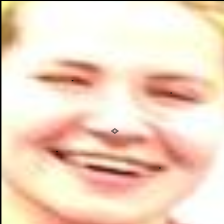

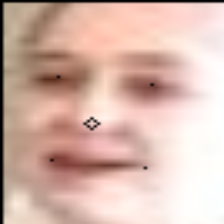

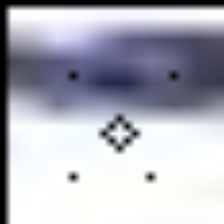

1/1 [==============================] - 0s 33ms/step


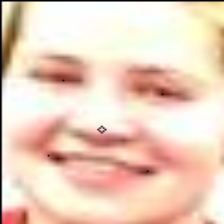

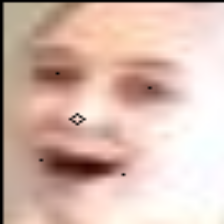

1/1 [==============================] - 0s 34ms/step


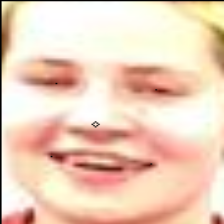

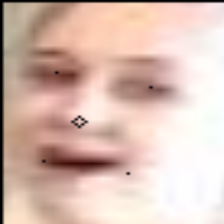

1/1 [==============================] - 0s 38ms/step


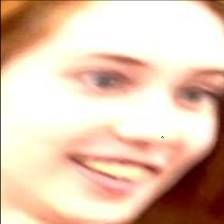

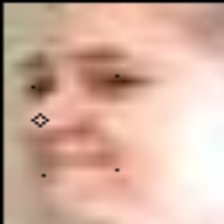

1/1 [==============================] - 0s 35ms/step


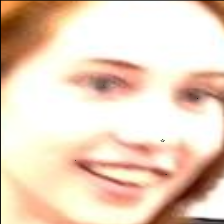

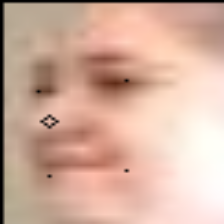

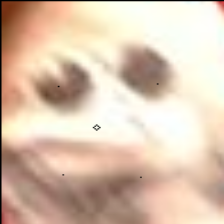

1/1 [==============================] - 0s 31ms/step


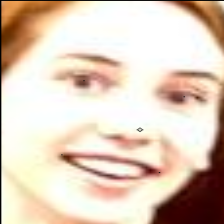

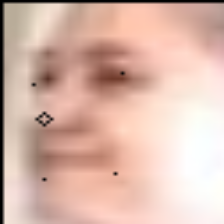

In [ ]:
# просто запускаем и ждем!
# from PIL import Image
detector = MTCNN()
k = 0
f = 0
for img_path in fnames_valid:
  img_r = cv2.imread(img_path)
  img = cv2.resize(img_r, None, fx=3, fy=3, interpolation=cv2.INTER_LINEAR)
  output = detector.detect_faces(img)
  # print(output)                                                                 #[{},{}...{}]
  for i in output:
    x,y,width,height = i['box']
    left_eyeX,left_eyeY = i['keypoints']['left_eye']
    right_eyeX,right_eyeY = i['keypoints']['right_eye']
    noseX,noseY = i['keypoints']['nose']
    mouth_leftX,mouth_leftY = i['keypoints']['mouth_left']
    mouth_rightX,mouth_rightY = i['keypoints']['mouth_right']

    cv2.circle(img,center=(left_eyeX,left_eyeY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(right_eyeX,right_eyeY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(noseX,noseY),color=(0,0,0),thickness=0,radius=2)
    cv2.circle(img,center=(mouth_leftX,mouth_leftY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(mouth_rightX,mouth_rightY),color=(0,0,0),thickness=0,radius=0)

    cv2.rectangle(img,pt1=(x,y),pt2=(x+width,y+height),color=(0,0,0),thickness=0)

    if len(output) == 0:
      img1 = img[150:150+250, 180:180+200]
    else:
      img1 = img[y:y+height, x:x+width]


    size = (224, 224)
    output_img = cv2.resize(img1, size)
    cv2.imwrite(img_path, output_img)
    cv2_imshow(output_img)

    cv2.waitKey(0)

# img = cv2.imread('image.jpg')
# resized_img = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
# cv2.imshow('Resized image', resized_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

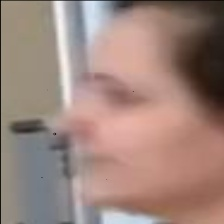

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-103_jpg.rf.6359979b8d3a46df62e58fab8ac02d24.jpg


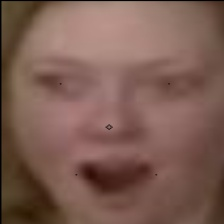

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-63_jpg.rf.9ff5ad2503fe5650a38ce4a544948908.jpg


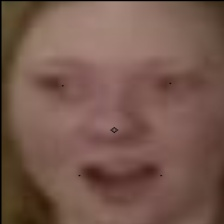

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-61_jpg.rf.cc1b93684bcea08d134be6370dd0852e.jpg


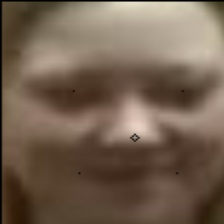

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-44_jpg.rf.8540d55d939d750d75bd5e7792c7b727.jpg


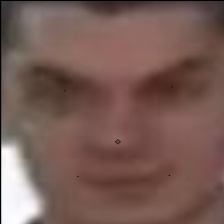

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8347_surprised_fhd-1-_mp4-1_jpg.rf.3a877d6dce3749d41283792dfa8e2726.jpg


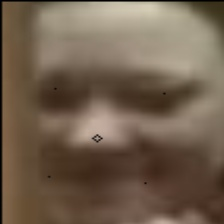

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-33_jpg.rf.dd9a71fb9052ec4a0335b10c3e147e1e.jpg


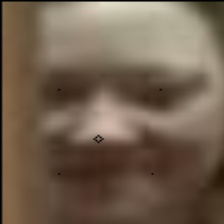

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-38_jpg.rf.77a13e7ce36a3084e1871d3fb9bcacfb.jpg


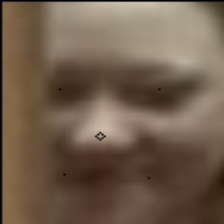

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-35_jpg.rf.9cd9b045995305651ac8af5324859673.jpg


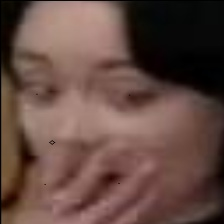

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-138_jpg.rf.e4fed0a23a05aff1d79de8b5fa11fa2b.jpg


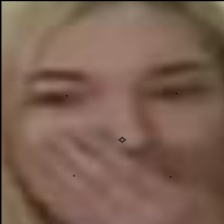

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-152_jpg.rf.2ed1ad9102e12500c16845247790524b.jpg


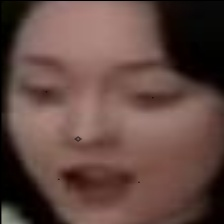

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-135_jpg.rf.a3845cef0f64ff0afbfe99dd00cc0825.jpg


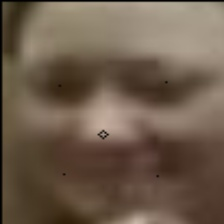

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-28_jpg.rf.deb456481cecc1daff1ace178a9dc32b.jpg


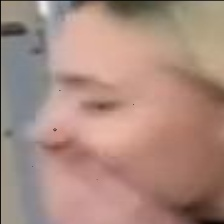

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-169_jpg.rf.14bb4af395fcca27771edbc7939913ed.jpg


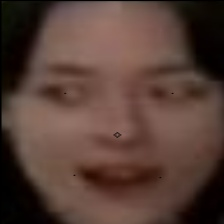

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-130_jpg.rf.d48a418f9016179fedd9409deede391e.jpg


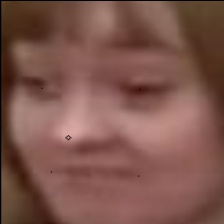

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-116_jpg.rf.af2a9ed1d24fc9636ffd118ba8c0c006.jpg


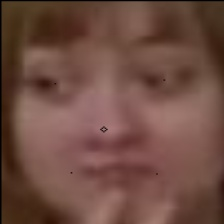

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-109_jpg.rf.1ce0e4b7e79730d6252fe250f9710c55.jpg


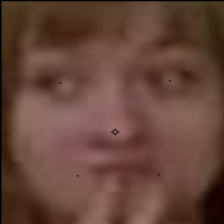

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/valid/images/IMG_8336_surprised_fhd_mp4-107_jpg.rf.ae1f281664152230bbe5452bed7d9d38.jpg


In [ ]:
# проверяем, что все фотографии обновились, и сохранились обрезанные квадраты лица
for img_path in fnames_valid:
  img_r = cv2.imread(img_path)
  cv2_imshow(img_r)
  print(img_path)

## **TEST set**

In [ ]:
# объединяем все пути к фотографиям из вышеуказанной папки, записываем эти пути в один список - fnames_valid
test_dir=os.path.join(test_dir)
fnames_valid = [os.path.join(test_dir, fname) for fname in os.listdir(test_dir)]

In [ ]:
# проверяем себя, чтобы в строчках действительно содержатся пути к фотографиям (см в конце каждого строчного элемента формат .jpg)
print(fnames_valid)



['/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8347_surprised_fhd-1-_mp4-3_jpg.rf.8b55fa78f18befd4154509dde84ca2f4.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-60_jpg.rf.1363d869ce45a525fd875795a3b514e5.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-131_jpg.rf.9f2e4f14a4c7bd7854a880e1318297e4.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-132_jpg.rf.108ff21c15a9309fc83e3ad5e785ff82.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-115_jpg.rf.041617bee170a0f2e9018eac340d1741.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-165_jpg.rf.49a35302521c8a00c0801e52e85d5c81.jpg', '/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-104_jp

1/1 [==============================] - 0s 142ms/step


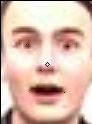

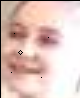

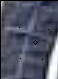

1/1 [==============================] - 0s 40ms/step


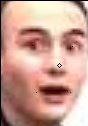

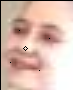

1/1 [==============================] - 0s 42ms/step


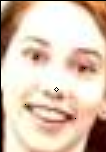

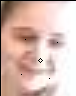

1/1 [==============================] - 0s 34ms/step


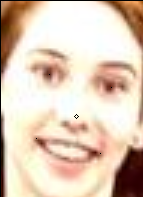

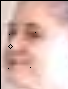

1/1 [==============================] - 0s 31ms/step


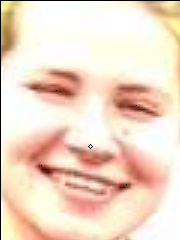

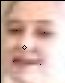

1/1 [==============================] - 0s 51ms/step


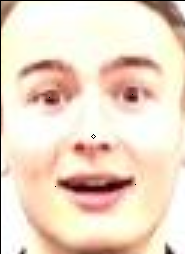

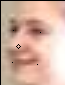

1/1 [==============================] - 0s 35ms/step


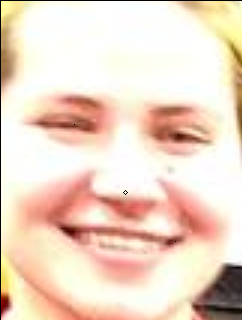

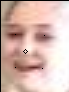

1/1 [==============================] - 0s 30ms/step


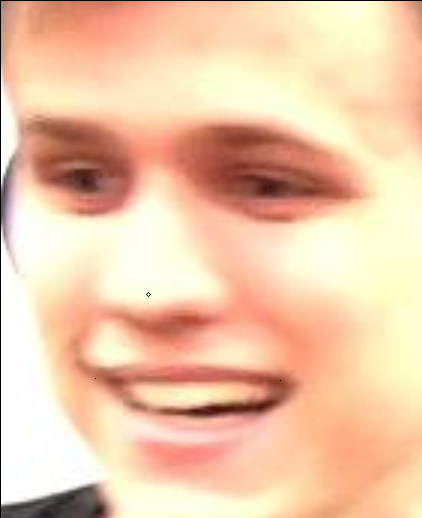

1/1 [==============================] - 0s 35ms/step


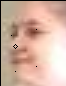

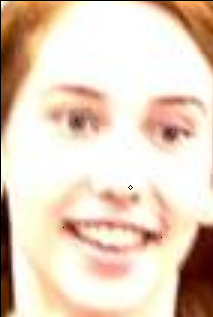

In [ ]:
# просто запускаем и ждем!
from PIL import Image
detector = MTCNN()
k = 0
f = 0
for img_path in fnames_valid:
  img_r = cv2.imread(img_path)
  img = cv2.resize(img_r, None, fx=3, fy=3, interpolation=cv2.INTER_LINEAR)
  output = detector.detect_faces(img)
  # print(output)                                                                 #[{},{}...{}]
  for i in output:
    x,y,width,height = i['box']
    left_eyeX,left_eyeY = i['keypoints']['left_eye']
    right_eyeX,right_eyeY = i['keypoints']['right_eye']
    noseX,noseY = i['keypoints']['nose']
    mouth_leftX,mouth_leftY = i['keypoints']['mouth_left']
    mouth_rightX,mouth_rightY = i['keypoints']['mouth_right']

    cv2.circle(img,center=(left_eyeX,left_eyeY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(right_eyeX,right_eyeY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(noseX,noseY),color=(0,0,0),thickness=0,radius=2)
    cv2.circle(img,center=(mouth_leftX,mouth_leftY),color=(0,0,0),thickness=0,radius=0)
    cv2.circle(img,center=(mouth_rightX,mouth_rightY),color=(0,0,0),thickness=0,radius=0)

    cv2.rectangle(img,pt1=(x,y),pt2=(x+width,y+height),color=(0,0,0),thickness=0)

    if len(output) == 0:
      img1 = img[150:150+250, 180:180+200]
    else:
      img1 = img[y:y+height, x:x+width]

    cv2_imshow(img1)
    size = (224, 224)
    output_img = cv2.resize(img1, size)
    cv2.imwrite(img_path, output_img)

    cv2.waitKey(0)

# img = cv2.imread('image.jpg')
# resized_img = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
# cv2.imshow('Resized image', resized_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

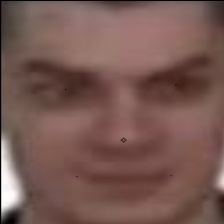

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8347_surprised_fhd-1-_mp4-3_jpg.rf.8b55fa78f18befd4154509dde84ca2f4.jpg


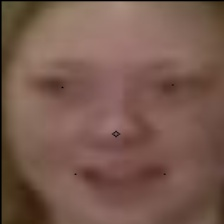

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-60_jpg.rf.1363d869ce45a525fd875795a3b514e5.jpg


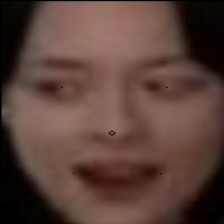

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-131_jpg.rf.9f2e4f14a4c7bd7854a880e1318297e4.jpg


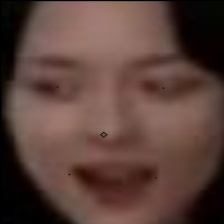

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-132_jpg.rf.108ff21c15a9309fc83e3ad5e785ff82.jpg


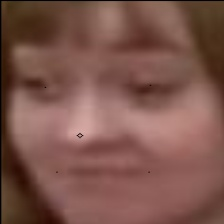

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-115_jpg.rf.041617bee170a0f2e9018eac340d1741.jpg


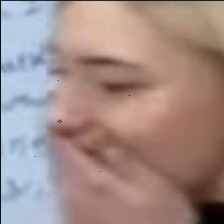

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-165_jpg.rf.49a35302521c8a00c0801e52e85d5c81.jpg


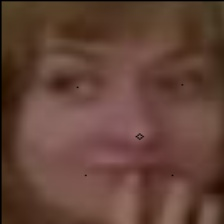

/content/gdrive/MyDrive/uni/ml/surprised_ER.v2i.yolov8 (1)/test/images/IMG_8336_surprised_fhd_mp4-104_jpg.rf.90a3619ce45b7dc443c795e35d2ae72d.jpg


In [ ]:
# проверяем, что все фотографии обновились, и сохранились обрезанные квадраты лица
for img_path in fnames_valid:
  img_r = cv2.imread(img_path)
  cv2_imshow(img_r)
  print(img_path)

In [ ]:
test_dir = '/content/gdrive/MyDrive/uni/ml/surprised_ER_new_all'
test2 = '/content/gdrive/MyDrive/uni/ml/surprised_ER_all'

test_dir=os.path.join(test_dir)
fnames_valid = [os.path.join(test_dir, fname) for fname in os.listdir(test_dir)]


for img_path in fnames_valid:
  img = cv2.imread(img_path)


  size = (224, 224)
  output_img = cv2.resize(img, size)
  cv2.imwrite(img_path, output_img)
  cv2.waitKey(0)